In [1]:
%matplotlib inline
%config InlineBackend.figure_format='svg'

import pandas as pd
from datetime import datetime, timedelta

import seaborn as sns
sns.set()

import matplotlib.pyplot as plt

import matplotlib.ticker as mticker
import matplotlib.dates as mdates

from scipy.signal import savgol_filter   # smooth the data

#plt.style.use('seaborn-white')
plt.style.use('seaborn-white')

In [2]:
pdr = pd.read_csv( "https://raw.githubusercontent.com/ClarksonAirlab/2019_sensor_workshop/master/Python/Tutorial/Tutorial%20Data/pDR_2_20190805_1.csv")
HW1 = pd.read_csv("https://raw.githubusercontent.com/ClarksonAirlab/2019_sensor_workshop/master/Python/Tutorial/Tutorial%20Data/argon24.csv")
HW2 = pd.read_csv("https://raw.githubusercontent.com/ClarksonAirlab/2019_sensor_workshop/master/Python/Tutorial/Tutorial%20Data/argon44.csv")

pdr.head()



,pm2.5,Temp,RHumidity,AtmoPressure,Flags,time,date
0,6.59,17.6,31,756.0,1.0,12:23:32,05-Aug-2019
1,7.89,17.6,31,756.0,0.0,12:23:33,05-Aug-2019
2,7.72,17.6,31,756.0,0.0,12:23:34,05-Aug-2019
3,7.48,17.6,30,762.0,0.0,12:23:35,05-Aug-2019
4,7.09,17.6,30,762.0,0.0,12:23:36,05-Aug-2019


In [3]:
pdr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70007 entries, 0 to 70006
Data columns (total 7 columns):
pm2.5            70007 non-null object
 Temp            70007 non-null object
 RHumidity       70007 non-null object
 AtmoPressure    70001 non-null float64
 Flags           70001 non-null float64
time             70001 non-null object
date             70001 non-null object
dtypes: float64(2), object(5)
memory usage: 3.7+ MB


In [4]:
pdr["DateTime"] = pdr["date"] + pdr["time"]
pdr["DateTime"] = pd.to_datetime(pdr["DateTime"])

In [5]:
cols = pdr.columns[pdr.dtypes.eq('object')]
pdr[cols] = pdr[cols].apply(pd.to_numeric,errors = 'coerce')

In [6]:
pdr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70007 entries, 0 to 70006
Data columns (total 8 columns):
pm2.5            70001 non-null float64
 Temp            70001 non-null float64
 RHumidity       70001 non-null float64
 AtmoPressure    70001 non-null float64
 Flags           70001 non-null float64
time             0 non-null float64
date             0 non-null float64
DateTime         70001 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(7)
memory usage: 4.3 MB


In [7]:
pdr.head()

,pm2.5,Temp,RHumidity,AtmoPressure,Flags,time,date,DateTime
0,6.59,17.6,31.0,756.0,1.0,NaN,NaN,2019-08-05 12:23:32
1,7.89,17.6,31.0,756.0,0.0,NaN,NaN,2019-08-05 12:23:33
2,7.72,17.6,31.0,756.0,0.0,NaN,NaN,2019-08-05 12:23:34
3,7.48,17.6,30.0,762.0,0.0,NaN,NaN,2019-08-05 12:23:35
4,7.09,17.6,30.0,762.0,0.0,NaN,NaN,2019-08-05 12:23:36


In [8]:
HW1.head()

,reg_date,id,pm25_standard,pm100_standard,Temperature,Humidity
0,2019-08-06 20:48:55,227807,11,12,28.68,55.990002
1,2019-08-06 20:48:50,227806,11,12,28.68,55.939999
2,2019-08-06 20:48:45,227805,11,12,28.67,55.889999
3,2019-08-06 20:48:40,227804,12,13,28.65,55.799999
4,2019-08-06 20:48:35,227803,16,17,28.65,55.740002


In [9]:
HW1.columns = ["DateTime","id","pm2.5hw1","pm10","Temp","RH"]
HW1.head()

,DateTime,id,pm2.5hw1,pm10,Temp,RH
0,2019-08-06 20:48:55,227807,11,12,28.68,55.990002
1,2019-08-06 20:48:50,227806,11,12,28.68,55.939999
2,2019-08-06 20:48:45,227805,11,12,28.67,55.889999
3,2019-08-06 20:48:40,227804,12,13,28.65,55.799999
4,2019-08-06 20:48:35,227803,16,17,28.65,55.740002


In [10]:
HW1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227807 entries, 0 to 227806
Data columns (total 6 columns):
DateTime    227807 non-null object
id          227807 non-null int64
pm2.5hw1    227807 non-null int64
pm10        227807 non-null int64
Temp        227807 non-null float64
RH          227807 non-null float64
dtypes: float64(2), int64(3), object(1)
memory usage: 10.4+ MB


In [11]:
HW1["DateTime"] = pd.to_datetime(HW1["DateTime"])

In [12]:
HW1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227807 entries, 0 to 227806
Data columns (total 6 columns):
DateTime    227807 non-null datetime64[ns]
id          227807 non-null int64
pm2.5hw1    227807 non-null int64
pm10        227807 non-null int64
Temp        227807 non-null float64
RH          227807 non-null float64
dtypes: datetime64[ns](1), float64(2), int64(3)
memory usage: 10.4 MB


In [13]:
HW2.columns = ["DateTime","id","pm2.5hw2","pm10","Temp","RH"]
HW2["DateTime"] = pd.to_datetime(HW2["DateTime"])

In [14]:
pdr.index=pdr['DateTime']
HW1.index=HW1['DateTime']
HW2.index=HW2['DateTime']

HW1=HW1.sort_values('id')
HW2=HW2.sort_values('id')

pdr=pdr['2019-08-05 13:26:00':'2019-08-06 07:50:00']
HW1=HW1['2019-08-05 13:26:00':'2019-08-06 07:50:00']
HW2=HW2['2019-08-05 13:26:00':'2019-08-06 07:50:00']


C:\Users\nuera\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, '$PM2.5$ ($ug/m^3$)')

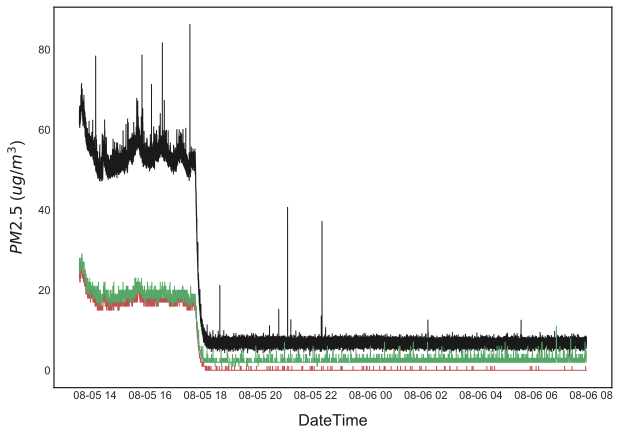

In [15]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(pdr['DateTime'],pdr['pm2.5'], color='k',linewidth=1,label='$PDR$')
ax1.plot(HW1['DateTime'],HW1['pm2.5hw1'], color='r',linewidth=1,label='$HW1$')
ax1.plot(HW2['DateTime'],HW2['pm2.5hw2'], color='g',linewidth=1,label='$HW2$')
ax1.set_xlabel('DateTime',color='k',fontsize=16,labelpad=13)
ax1.set_ylabel('$PM2.5$ ($ug/m^3$)',color='k',fontsize=16,labelpad=13)


In [16]:

pdrn=pdr.resample('5s').mean()


In [17]:
pdrn=pdrn.reset_index()


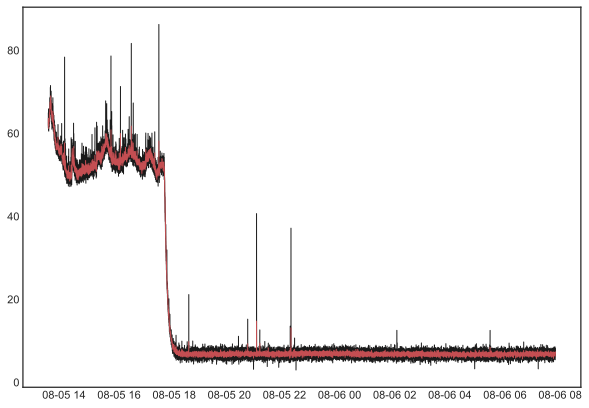

In [18]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(pdr['DateTime'],pdr['pm2.5'], color='k',linewidth=1,label='$PDR$')
ax1.plot(pdrn['DateTime'],pdrn['pm2.5'], color='r',linewidth=1,label='$PDRN$')




In [19]:
HW1=HW1.drop(['DateTime'], axis=1)


In [20]:
HW1=HW1.reset_index()


In [21]:
HW2=HW2.drop(['DateTime'], axis=1)
HW2=HW2.reset_index()


In [22]:


df = pd.merge_asof(pdrn,HW1[['DateTime','pm2.5hw1']], on='DateTime', tolerance=pd.Timedelta("5 minutes"), direction='nearest').fillna('NaN')
df = pd.merge_asof(df,HW2[['DateTime','pm2.5hw2']], on='DateTime', tolerance=pd.Timedelta("5 minutes"), direction='nearest').fillna('NaN')


In [23]:
df.head()

,DateTime,pm2.5,Temp,RHumidity,AtmoPressure,Flags,time,date,pm2.5hw1,pm2.5hw2
0,2019-08-05 13:26:00,62.412,22.0,27.0,744.0,0.0,NaN,NaN,24,25
1,2019-08-05 13:26:05,63.616,22.0,27.0,744.0,0.0,NaN,NaN,23,25
2,2019-08-05 13:26:10,61.898,22.0,27.0,744.0,0.0,NaN,NaN,23,26
3,2019-08-05 13:26:15,63.210,22.0,27.0,744.0,0.0,NaN,NaN,23,28
4,2019-08-05 13:26:20,62.480,22.0,27.0,753.6,0.0,NaN,NaN,24,27


In [24]:
plt.figure(figsize=(10,8))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.scatter(df['pm2.5hw1'],df['pm2.5'], color= 'k',alpha=0.9,label='hw1')
plt.scatter(df['pm2.5hw2'],df['pm2.5'], color= 'r',alpha=0.9,label='hw2')


plt.legend( loc='best',fontsize=17)

plt.title("Test with PDR", fontsize=16)
plt.ylabel('PDR pm2.5',fontsize=16,color='k',labelpad=13)
plt.xlabel('Honeywell pm2.5',fontsize=16,color='k',labelpad=13)

#plt.show()
#plt.savefig('books_read.png',dpi=300)

Text(0.5, 0, 'Honeywell pm2.5')

In [25]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [26]:
df['pdr']=df['pm2.5']
df['hw1']=df['pm2.5hw1']

In [27]:
df.head()

,DateTime,pm2.5,Temp,RHumidity,AtmoPressure,Flags,time,date,pm2.5hw1,pm2.5hw2,pdr,hw1
0,2019-08-05 13:26:00,62.412,22.0,27.0,744.0,0.0,NaN,NaN,24,25,62.412,24
1,2019-08-05 13:26:05,63.616,22.0,27.0,744.0,0.0,NaN,NaN,23,25,63.616,23
2,2019-08-05 13:26:10,61.898,22.0,27.0,744.0,0.0,NaN,NaN,23,26,61.898,23
3,2019-08-05 13:26:15,63.210,22.0,27.0,744.0,0.0,NaN,NaN,23,28,63.210,23
4,2019-08-05 13:26:20,62.480,22.0,27.0,753.6,0.0,NaN,NaN,24,27,62.480,24


In [28]:
results = smf.ols('pdr ~ hw1', data=df).fit()

In [29]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                    pdr   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 3.436e+06
Date:                Wed, 07 Aug 2019   Prob (F-statistic):               0.00
Time:                        16:15:26   Log-Likelihood:                -21533.
No. Observations:               13249   AIC:                         4.307e+04
Df Residuals:                   13247   BIC:                         4.308e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      6.8350      0.012    559.634      0.0

In [30]:
df['chw1']=df['hw1']*2.6652+6.8350

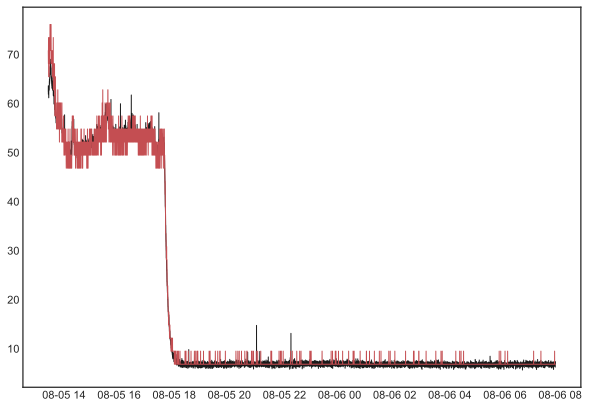

In [31]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(df['DateTime'],df['pdr'], color='k',linewidth=1,label='PDR')

ax1.plot(df['DateTime'],df['chw1'], color='r',linewidth=1,label='chw1')


Text(0.5, 0, 'Honeywell pm2.5')

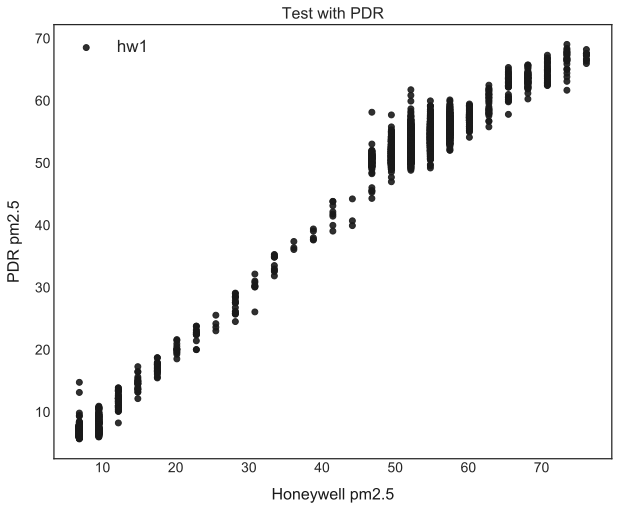

In [32]:
plt.figure(figsize=(10,8))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.scatter(df['chw1'],df['pdr'], color= 'k',alpha=0.9,label='hw1')


plt.legend( loc='best',fontsize=17)

plt.title("Test with PDR", fontsize=16)
plt.ylabel('PDR pm2.5',fontsize=16,color='k',labelpad=13)
plt.xlabel('Honeywell pm2.5',fontsize=16,color='k',labelpad=13)

#plt.show()
#plt.savefig('books_read.png',dpi=300)

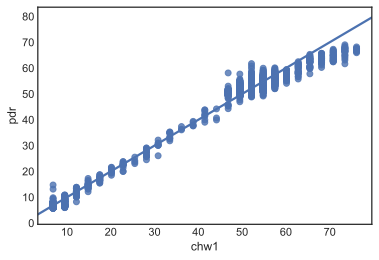

In [33]:
import seaborn as sns
ax = sns.regplot(x="chw1", y="pdr", data=df)